In [10]:
'''
!git clone https://github.com/openai/gym.git
%cd gym
!pip install -e .
%cd ..
'''

# instalar rSim
!apt-get update
!apt-get install qt5-default libode-dev
!cd build
!git clone https://github.com/robocin/rSim.git
%cd rSim
!mkdir buildc
%cd buildc
!ls
!cmake ..
!make -j4
%cd ..
!pip install -e .
%cd ..

# instalar rSoccer
!git clone https://github.com/robocin/rSoccer.git
%cd rSoccer
!pip install -e ./
%cd ..

# instalar a lib ptan
!pip install ptan

# libs de visualização
!pip install gym pyvirtualdisplay > /dev/null 2>&1
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B]
Get:4 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:8 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:9 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:10 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ Packages [62.9 kB]
Get:11 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:13 http://ppa.launchpad.net/cran/

# **Agente** (Rede neural)

*   Output da rede Actor -> Vetor N-dimensional onde cada elemento está contido em [-1,1] 
*   Output da rede Critic -> Q(s,a)



In [4]:
from torch import nn
import ptan

# O actor não computa mais um output aleatório, mas sim deterministico
# Como range das ações é [-1,1], utiliza-se uma Tanh para restringir
# o output para cada ação neste range.
class DDPGActor(nn.Module):
  def __init__(self, obs_size, act_size):
    super(DDPGActor, self).__init__()
    self.net = nn.Sequential(
      nn.Linear(obs_size, 400),
      nn.ReLU(),
      nn.Linear(400, 300),
      nn.ReLU(),
      nn.Linear(300, act_size),
      nn.Tanh()
      )

  def forward(self, x):
    return self.net(x)

# O crítico estima Q(s,a) - não é mais utilizado como baseline 
class DDPGCritic(nn.Module):
  def __init__(self, obs_size, act_size):
    super(DDPGCritic, self).__init__()
    self.obs_net = nn.Sequential(
      nn.Linear(obs_size, 400),
      nn.ReLU(),
      )
    self.out_net = nn.Sequential(
      nn.Linear(400 + act_size, 300),
      nn.ReLU(),
      nn.Linear(300, 1)
      )
  def forward(self, x, a):
    obs = self.obs_net(x)
    # concatenar observações processadas e ações, para estimar Q(s,a)
    return self.out_net(torch.cat([obs, a], dim=1))


In [17]:
class AgentDDPG(ptan.agent.BaseAgent):
  """
  Agent implementing Orstein-Uhlenbeck exploration process
  """
  def __init__(self, net, device="cpu", ou_enabled=True,
                ou_mu=0.0, ou_teta=0.15, ou_sigma=0.2,
                ou_epsilon=1.0):
    self.net = net
    self.device = device
    self.ou_enabled = ou_enabled
    self.ou_mu = ou_mu
    self.ou_teta = ou_teta
    self.ou_sigma = ou_sigma
    self.ou_epsilon = ou_epsilon
  
  def initial_state(self):
    return None

  # converter observações em ações
  def __call__(self, states, agent_states):
    states_v = ptan.agent.float32_preprocessor(states)
    states_v = states_v.to(self.device)
    mu_v = self.net(states_v)
    actions = mu_v.data.cpu().numpy()

    # processo OU para adicionar exploração  
    if self.ou_enabled and self.ou_epsilon > 0:
      new_a_states = []
      for a_state, action in zip(agent_states, actions):
        if a_state is None:
          a_state = np.zeros(shape=action.shape, dtype=np.float32)
        a_state += self.ou_teta * (self.ou_mu - a_state)
        a_state += self.ou_sigma * np.random.normal(size=action.shape)
        action += self.ou_epsilon * a_state
        new_a_states.append(a_state)
    else:
      new_a_states = agent_states
    
    actions = np.clip(actions, -1, 1)
    return actions, agent_states

In [7]:
import math

def test_net(net, env, count=10, device="cpu"):
  rewards = 0.0
  steps = 0
  for _ in range(count):
    obs = env.reset()
    while True:
      obs_v = ptan.agent.float32_preprocessor([obs])
      obs_v = obs_v.to(device)
      mu_v = net(obs_v)
      action = mu_v.squeeze(dim=0).data.cpu().numpy()
      action = np.clip(action, -1, 1)
      obs, reward, done, _ = env.step(action)
      rewards += reward
      steps += 1
      if done:
        break
  return rewards / count, steps / count


# **Parâmetros de treinamento**

In [12]:
import time
import numpy as np
import collections
import torch
import torch.nn as nn
import torch.optim as optim

DEFAULT_ENV_NAME = "SSLPassEndurance-v0"

GAMMA = 0.99
BATCH_SIZE = 64
LEARNING_RATE = 1e-4
REPLAY_SIZE = 100000
REPLAY_INITIAL = 10000
CUDA = False

TEST_ITERS = 1000

#Conversão de dados de treino em tensores

In [9]:
def unpack_batch_ddqn(batch, device="cpu"):
    states, actions, rewards, dones, last_states = [], [], [], [], []
    for exp in batch:
        states.append(exp.state)
        actions.append(exp.action)
        rewards.append(exp.reward)
        dones.append(exp.last_state is None)
        if exp.last_state is None:
            last_states.append(exp.state)
        else:
            last_states.append(exp.last_state)
    states_v = ptan.agent.float32_preprocessor(states).to(device)
    actions_v = ptan.agent.float32_preprocessor(actions).to(device)
    rewards_v = ptan.agent.float32_preprocessor(rewards).to(device)
    last_states_v = ptan.agent.float32_preprocessor(last_states).to(device)
    dones_t = torch.BoolTensor(dones).to(device)
    return states_v, actions_v, rewards_v, dones_t, last_states_v

# Loop principal

O DDPG é off-policy, portanto faz uso de replay buffers

In [23]:
import gym 
import rsoccer_gym
import ptan
import torch.nn.functional as F

env = gym.make(DEFAULT_ENV_NAME)
test_env = gym.make(DEFAULT_ENV_NAME)
device = torch.device("cuda" if CUDA else "cpu")

act_net = DDPGActor(env.observation_space.shape[0],
        env.action_space.shape[0]).to(device)
crt_net = DDPGCritic(env.observation_space.shape[0],
        env.action_space.shape[0]).to(device)
print(act_net)
print(crt_net)
tgt_act_net = ptan.agent.TargetNet(act_net)
tgt_crt_net = ptan.agent.TargetNet(crt_net)

agent = AgentDDPG(act_net, device=device)
exp_source = ptan.experience.ExperienceSourceFirstLast(
        env, agent, gamma=GAMMA, steps_count=1)
buffer = ptan.experience.ExperienceReplayBuffer(
        exp_source, buffer_size=REPLAY_SIZE)

act_opt = optim.Adam(act_net.parameters(), lr=LEARNING_RATE)
crt_opt = optim.Adam(crt_net.parameters(), lr=LEARNING_RATE)

frame_idx = 0
best_reward = None
rewards_ = [] 
steps_ = []
while True:  
  frame_idx += 1
  buffer.populate(1)
  rewards_steps = exp_source.pop_rewards_steps()
  if rewards_steps:
      rewards, steps = zip(*rewards_steps)

  if frame_idx % TEST_ITERS == 0:
      ts = time.time()
      rewards, steps = test_net(act_net, test_env, device=device)
      rewards_.append(rewards)
      steps_.append(frame_idx)
      print("Test done is %.2f sec, reward %.3f, steps %d, total_steps %d" % (
          time.time() - ts, rewards, steps, frame_idx))
      if best_reward is None or best_reward < rewards:
          if best_reward is not None:
              print("Best reward updated: %.3f -> %.3f" % (best_reward, rewards))
              name = DEFAULT_ENV_NAME + "-DDPG.dat"
              torch.save(act_net.state_dict(), name)
          best_reward = rewards

  if len(buffer) < REPLAY_INITIAL:
    continue

  # unpack experience batch
  batch = buffer.sample(BATCH_SIZE)
  states_v, actions_v, rewards_v, \
          dones_mask, last_states_v = unpack_batch_ddqn(batch, device)

  # train critic
  crt_opt.zero_grad()
  q_v = crt_net(states_v, actions_v)
  last_act_v = tgt_act_net.target_model(last_states_v)
  q_last_v = tgt_crt_net.target_model(last_states_v, last_act_v)
  q_last_v[dones_mask] = 0.0
  q_ref_v = rewards_v.unsqueeze(dim=-1) + q_last_v * GAMMA
  critic_loss_v = F.mse_loss(q_v, q_ref_v.detach())
  critic_loss_v.backward()
  crt_opt.step()

  # train actor
  act_opt.zero_grad()
  cur_actions_v = act_net(states_v)
  actor_loss_v = -crt_net(states_v, cur_actions_v)
  actor_loss_v = actor_loss_v.mean()
  actor_loss_v.backward()
  act_opt.step()

  tgt_act_net.alpha_sync(alpha=1 - 1e-3)
  tgt_crt_net.alpha_sync(alpha=1 - 1e-3)

  if frame_idx >= 1e6:
    break


Environment initialized
Environment initialized
DDPGActor(
  (net): Sequential(
    (0): Linear(in_features=16, out_features=400, bias=True)
    (1): ReLU()
    (2): Linear(in_features=400, out_features=300, bias=True)
    (3): ReLU()
    (4): Linear(in_features=300, out_features=3, bias=True)
    (5): Tanh()
  )
)
DDPGCritic(
  (obs_net): Sequential(
    (0): Linear(in_features=16, out_features=400, bias=True)
    (1): ReLU()
  )
  (out_net): Sequential(
    (0): Linear(in_features=403, out_features=300, bias=True)
    (1): ReLU()
    (2): Linear(in_features=300, out_features=1, bias=True)
  )
)
Test done is 0.46 sec, reward -1.002, steps 18, total_steps 1000
Test done is 0.48 sec, reward -1.001, steps 19, total_steps 2000
Best reward updated: -1.002 -> -1.001
Test done is 0.47 sec, reward -1.000, steps 19, total_steps 3000
Best reward updated: -1.001 -> -1.000
Test done is 0.47 sec, reward -1.001, steps 19, total_steps 4000
Test done is 0.48 sec, reward -0.999, steps 20, total_steps 

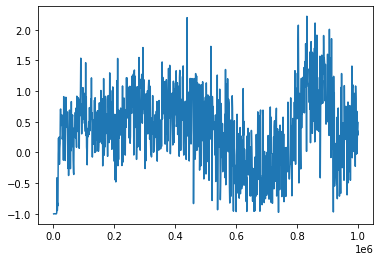

In [24]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(steps_,rewards_)

# Agente treinado em ação

In [25]:
def show_gif(fname):
    import base64
    from IPython import display
    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

Environment initialized



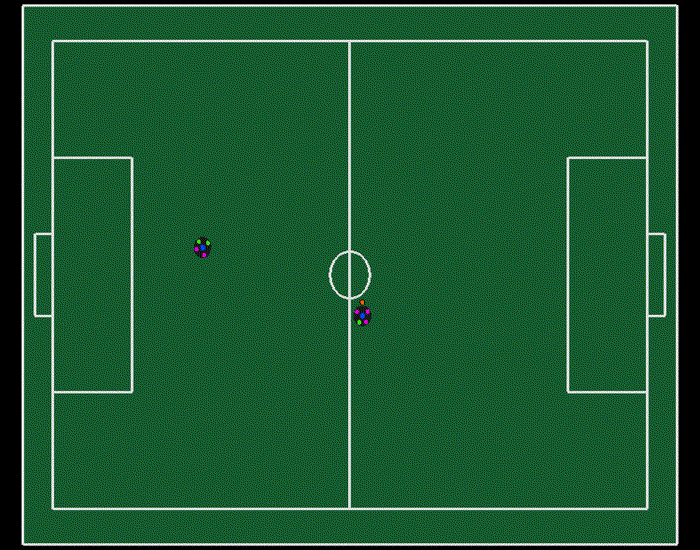

In [38]:
import gym
import ptan

from PIL import Image
import matplotlib.pyplot as plt
from IPython import display as ipythondisplay

from pyvirtualdisplay import Display
display = Display(visible=0, size=(200, 150))
display.start()

# ambiente
env = gym.make(DEFAULT_ENV_NAME)

# agente
net = DDPGActor(env.observation_space.shape[0],env.action_space.shape[0])
net.load_state_dict(torch.load(DEFAULT_ENV_NAME + "-DDPG.dat"))
net.eval()
agent = AgentDDPG(net, device=device)

# start simulation
for i in range(1):
  done = False
  frames = []
  observation = env.reset()
  while not done:
    obs_v = torch.FloatTensor([observation])
    action, _ = agent(obs_v, [])
    observation, reward, done, info = env.step(action[0]) 
    screen = Image.fromarray(env.render(mode='rgb_array'))
    screen = screen.resize(size=(700, 550))
    frames.append(screen) 

env.close()

frames[0].save('episode.gif', format='GIF',
               append_images=frames[1:], save_all=True, loop = 100, duration =0.0001)

show_gif('episode.gif')

Agente com politica aleatória

Environment initialized



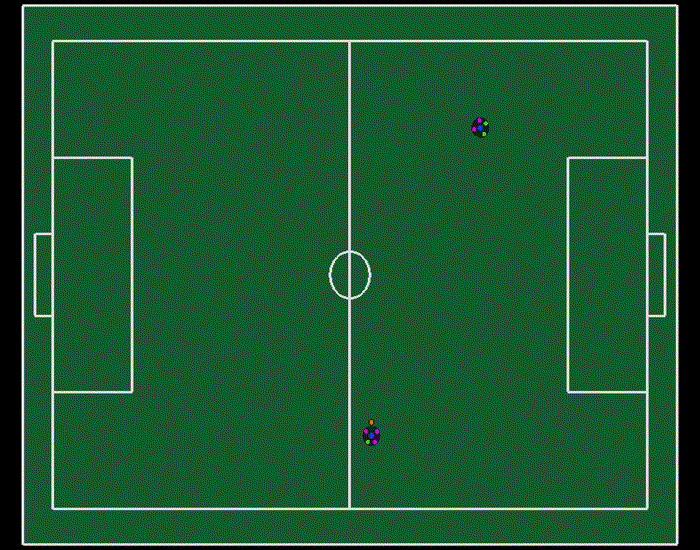

In [39]:
import gym 
import rsoccer_gym

from PIL import Image
import matplotlib.pyplot as plt
from IPython import display as ipythondisplay

from pyvirtualdisplay import Display
display = Display(visible=0, size=(200, 150))
display.start()

#env = gym.make("SSLPassEnduranceMA-v0")
env = gym.make("SSLPassEndurance-v0")
observation = env.reset()
for i in range(1):
  done = False
  frames = []
  while not done:
    #env.render()
    action = env.action_space.sample()
    #print(action)
    observation, reward, done, info = env.step(action)   
    #print(observation)
    screen = Image.fromarray(env.render(mode='rgb_array'))
    screen = screen.resize(size=(700, 550))
    frames.append(screen)   
    #if done:
    #    observation = env.reset() 

env.close()
frames[0].save('episode.gif', format='GIF',
               append_images=frames[1:], save_all=True, loop = 100, duration =0.0001)

show_gif('episode.gif')